# Figure 1 Surface soil categorisation according to the pH across the regions of Abu Dhabi, Al Ain and Al Dhafra

In [9]:
import os
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as cx
import matplotlib as mpl

import matplotlib.colors as mcolors
from matplotlib.patches import Rectangle, FancyArrowPatch, Patch

mpl.rcParams["figure.dpi"] = 300
mpl.rcParams["savefig.dpi"] = 300

# =================================================
# 0) Config
# =================================================
EXCEL_PATH = r"../Soil quality data/Soil quality data 2025.xlsx"
SHEET_NAME = "PHChemical"

PROTECTED_GPKG = "../data_hmq/Map/abu_dhabi_protected_areas.gpkg"
PROTECTED_LAYER = "Protected_Areas"

ABU_DHABI_SHP = r"../data_hmq/Map/abu_dhabi.shp"
BASEMAP = cx.providers.Esri.WorldGrayCanvas

OUT_DIR = r"../Result_hmq/Ch06_Figures"
os.makedirs(OUT_DIR, exist_ok=True)

# 你希望的 3 个区（匹配用关键词）
REGION_KEYWORDS = [
    ("Al Dhafra", ["Dhafra"]),
    ("Abu Dhabi", ["Abu Dhabi"]),
    ("Al Ain",    ["Ain"]),
]

# AOI bbox padding（米）
PAD_MIN_M = 1000
PAD_RATIO = 0.05

# pH bins（low < x <= high）
ph_bins = [
    (-float("inf"), 5.6,  "Strongly Acidic (<5.6)"),
    (5.6, 6.0,       "Moderately Acidic (5.6–6.0)"),
    (6.1, 6.5,       "Slightly Acidic (6.1–6.5)"),
    (6.6, 7.3,       "Neutral (6.6–7.3)"),
    (7.4, 7.8,       "Slightly Alkaline (7.4–7.8)"),
    (7.9, 8.4,       "Moderately Alkaline (7.9–8.4)"),
    (8.5, 9.0,       "Strongly Alkaline (8.5–9.0)"),
    (9.0, float("inf"), "Extremely Alkaline (>9.0)"),
]

# 从 cmap 抽离散颜色（你可以改成 "cividis" / "viridis" / "YlOrBr" / "plasma" 等）
CMAP_NAME = "GnBu"

In [10]:
# =================================================
# 1) Decorations: North arrow + scale bar
# =================================================
def add_north_arrow(ax, x=0.05, y=0.86, dy=0.07):
    arrow = FancyArrowPatch(
        (x, y), (x, y + dy),
        transform=ax.transAxes,
        arrowstyle="-|>",
        linewidth=1.2,
        color="black",
        zorder=30
    )
    ax.add_patch(arrow)
    ax.text(
        x, y + dy + 0.01, "N",
        transform=ax.transAxes,
        ha="center", va="bottom",
        fontsize=10, zorder=30
    )

def add_scale_bar(ax, xmin, ymin, xmax, ymax, length_km=200):
    length_m = length_km * 1000
    x0 = xmin + 0.05 * (xmax - xmin)
    y0 = ymin + 0.05 * (ymax - ymin)

    ax.plot([x0, x0 + length_m], [y0, y0],
            color="black", linewidth=4, zorder=30)

    ax.text(x0, y0 - 0.02 * (ymax - ymin), "0",
            ha="center", va="top", fontsize=9)

    ax.text(x0 + length_m, y0 - 0.02 * (ymax - ymin),
            f"{length_km} km",
            ha="center", va="top", fontsize=9)

Sites (dedup by SiteUID): 709
[INFO] Al Dhafra: points=182 pad(km)=16.6 bbox(km) w=365.0 h=214.8
[INFO] Abu Dhabi: points=285 pad(km)=7.8 bbox(km) w=144.8 h=171.1
[INFO] Al Ain: points=242 pad(km)=11.6 bbox(km) w=127.5 h=255.9


C:\Users\blkmo\AppData\Local\Temp\ipykernel_13524\2139058466.py:95: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  pts_in = gdf[gdf.within(reg_poly.unary_union)].copy()
C:\Users\blkmo\AppData\Local\Temp\ipykernel_13524\2139058466.py:95: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  pts_in = gdf[gdf.within(reg_poly.unary_union)].copy()
C:\Users\blkmo\AppData\Local\Temp\ipykernel_13524\2139058466.py:95: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  pts_in = gdf[gdf.within(reg_poly.unary_union)].copy()


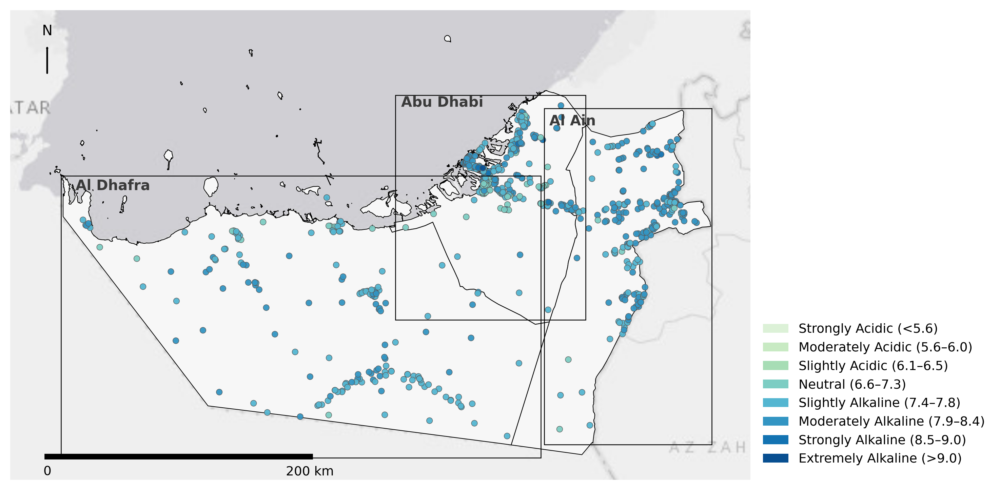

In [11]:
# =================================================
# 2) Read base data
# =================================================
data = pd.read_excel(EXCEL_PATH, sheet_name=SHEET_NAME)
data = data[(data["PHUID"] == 1) & (data["PHSampleUID"] == 1)]
regions = gpd.read_file(ABU_DHABI_SHP).to_crs(3857)

protected = gpd.read_file(PROTECTED_GPKG, layer=PROTECTED_LAYER).to_crs(3857)
protected = protected[(~protected.geometry.isna()) & (~protected.geometry.is_empty)].copy()

# =================================================
# 3) Find region name field
# =================================================
candidate_fields = ["NAMEENGLISH", "NameEnglish", "NAME", "Name", "Region", "REGION", "emirate", "EMIRATE"]
name_field = None
for f in candidate_fields:
    if f in regions.columns:
        name_field = f
        break
if name_field is None:
    raise ValueError(f"Cannot find region name field in regions. Available columns: {list(regions.columns)}")

# =================================================
# 4) Build points GeoDataFrame (dedup by SiteUID) + satph
#    NOTE: this uses ALL SurveyID. If you want one land-use, filter by SurveyID here.
# =================================================
sub = data.copy()
sub = sub.dropna(subset=["Longitude", "Latitude", "SiteUID", "satph"])
sub = sub.sort_values("SiteUID").drop_duplicates(subset=["SiteUID"])

gdf = gpd.GeoDataFrame(
    sub,
    geometry=gpd.points_from_xy(sub["Longitude"], sub["Latitude"]),
    crs="EPSG:4326",
).to_crs(3857)

print("Sites (dedup by SiteUID):", len(gdf))

# =================================================
# 5) pH binning + colors sampled from cmap
# =================================================
labels = [b[2] for b in ph_bins]

# round to 1 decimal to avoid gaps like 6.0 vs 6.1
gdf["satph_round"] = pd.to_numeric(gdf["satph"], errors="coerce").round(1)

def _assign_ph_label(x):
    if pd.isna(x):
        return np.nan
    for lo, hi, lab in ph_bins:
        if (x >= lo) and (x <= hi):
            return lab
    return np.nan

gdf["ph_label"] = gdf["satph_round"].apply(_assign_ph_label)

# sample discrete colors from cmap (avoid too-light ends)
cmap = mpl.colormaps.get(CMAP_NAME)
n = len(labels)
sample_pos = np.linspace(0.15, 0.95, n)
ph_colors = [mcolors.to_hex(cmap(p)) for p in sample_pos]
label2color = dict(zip(labels, ph_colors))

# color per point (NaN -> grey)
gdf["ph_color"] = gdf["ph_label"].map(label2color).fillna("#9e9e9e")

# legend handles
ph_legend_handles = [
    Patch(facecolor=label2color[lab], edgecolor="none", label=lab)
    for lab in labels
]

# =================================================
# 6) Split regions (3 main regions)
# =================================================
regions_3 = []
for label, keys in REGION_KEYWORDS:
    mask = np.zeros(len(regions), dtype=bool)
    for k in keys:
        mask |= regions[name_field].astype(str).str.contains(k, case=False, na=False)
    reg = regions[mask].copy()
    if len(reg) == 0:
        print(f"[WARN] Region '{label}' not matched by keywords {keys} in field '{name_field}'")
    regions_3.append((label, reg))

# =================================================
# 7) Compute AOI bboxes by "points inside region"
# =================================================
region_aoi = []  # (label, bbox, pts_in)
for label, reg_poly in regions_3:
    if len(reg_poly) == 0:
        continue

    # points within region polygon(s)
    pts_in = gdf[gdf.within(reg_poly.unary_union)].copy()
    # If boundary points are missing, use intersects instead:
    # pts_in = gdf[gdf.intersects(reg_poly.unary_union)].copy()

    if len(pts_in) == 0:
        print(f"[WARN] No points inside region '{label}'. Skip AOI.")
        continue

    xmin, ymin, xmax, ymax = pts_in.total_bounds
    w = xmax - xmin
    h = ymax - ymin
    pad = max(PAD_MIN_M, PAD_RATIO * max(w, h))

    bbox = (xmin - pad, ymin - pad, xmax + pad, ymax + pad)
    region_aoi.append((label, bbox, pts_in))

    print(f"[INFO] {label}: points={len(pts_in)} pad(km)={pad/1000:.1f} "
          f"bbox(km) w={(bbox[2]-bbox[0])/1000:.1f} h={(bbox[3]-bbox[1])/1000:.1f}")

# =================================================
# 8) FULL MAP (points colored by pH bins + protected areas + AOI rectangles)
# =================================================
fig, ax = plt.subplots(figsize=(12, 6))

xmin, ymin, xmax, ymax = regions.total_bounds
xpad = 0.06 * (xmax - xmin)
ypad = 0.06 * (ymax - ymin)

ax.set_xlim(xmin - xpad, xmax + xpad)
ax.set_ylim(ymin - ypad, ymax + ypad)

cx.add_basemap(ax, source=BASEMAP, zoom=7, attribution=False)

regions.plot(ax=ax, facecolor="#f7f7f7", edgecolor="black", linewidth=0.5, zorder=5)

ax.scatter(
    gdf.geometry.x, gdf.geometry.y,
    s=18, c=gdf["ph_color"],
    edgecolors="#5a5a5a",
    linewidths=0.35,
    alpha=0.95,
    zorder=10
)

# AOI rectangles + labels
for label, bbox, pts_in in region_aoi:
    bxmin, bymin, bxmax, bymax = bbox
    ax.add_patch(Rectangle(
        (bxmin, bymin), bxmax-bxmin, bymax-bymin,
        fill=False, edgecolor="black", linewidth=0.6, zorder=20
    ))
    ax.text(
        bxmin + 0.03*(bxmax-bxmin),
        bymax - 0.05*(bymax-bymin),
        label,
        fontsize=10, weight="bold", color="#3a3a3a", zorder=21
    )

# Legend (pH bins)
ax.legend(
    handles=ph_legend_handles,
    loc="lower left",
    bbox_to_anchor=(1.01, 0.02),  # 👉 图外右侧，靠下
    frameon=False,
    fontsize=9,
    ncol=1,
    borderaxespad=0.0
)

ax.set_axis_off()
add_north_arrow(ax)
add_scale_bar(ax, xmin - xpad, ymin - ypad, xmax + xpad, ymax + ypad, length_km=200)

# fig.savefig(os.path.join(OUT_DIR, "Full_pH_bins.png"), dpi=300, bbox_inches="tight")
plt.show()
fig.savefig(os.path.join(OUT_DIR, "Ch06_pH_full.png"), bbox_inches="tight", pad_inches=0.1)
fig.savefig(os.path.join(OUT_DIR, "Ch06_pH_full.svg"), bbox_inches="tight", pad_inches=0.1)

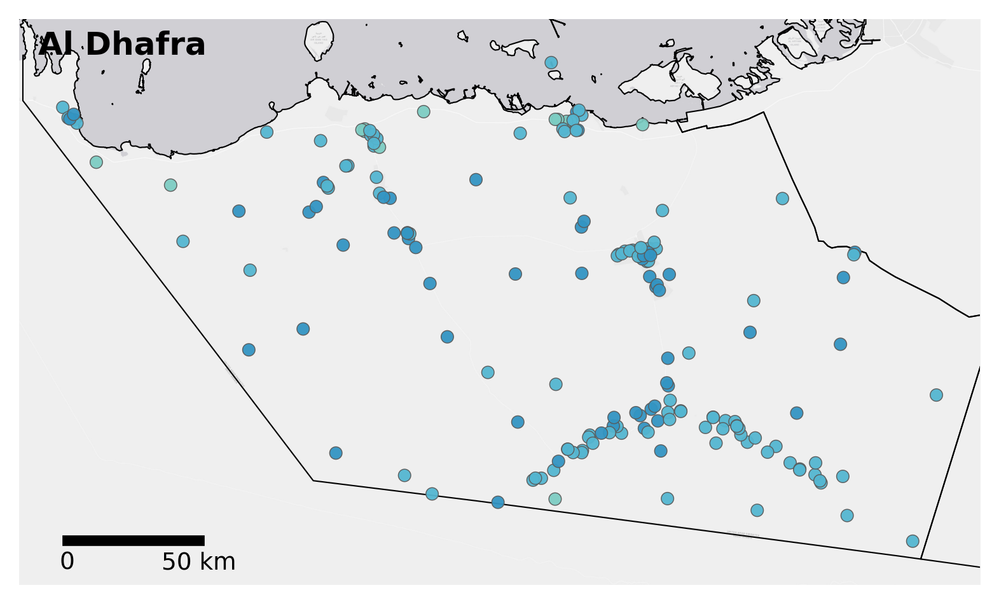

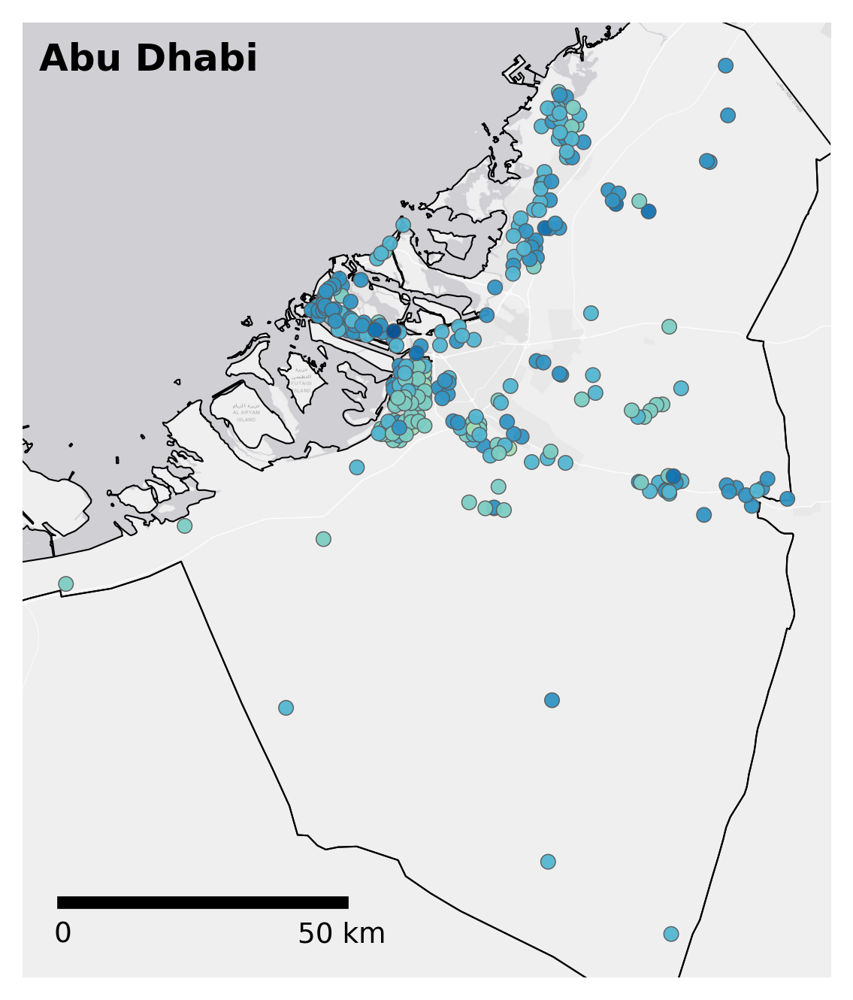

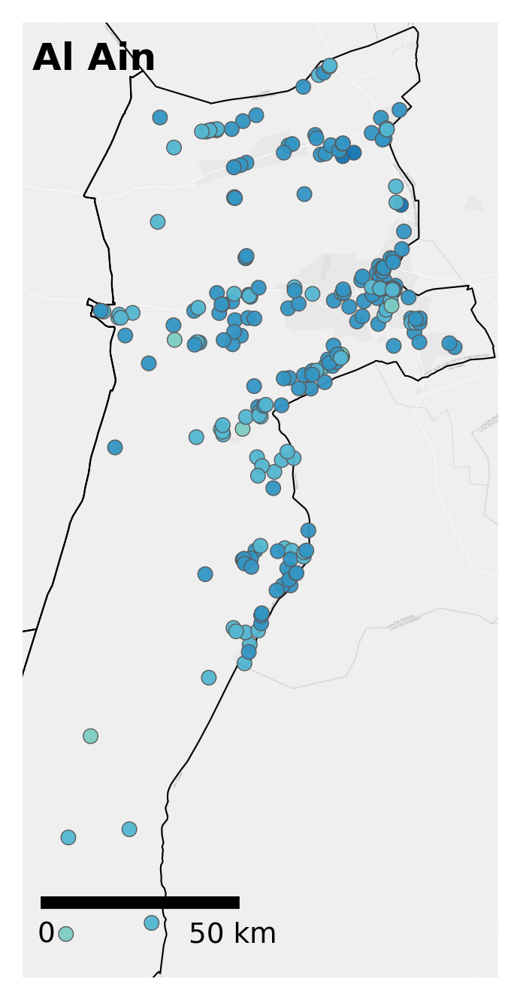

In [12]:
# =================================================
# 9) REGION MAPS (3 separate figures; points colored by pH bins)
# =================================================
for label, bbox, pts_in in region_aoi:
    bxmin, bymin, bxmax, bymax = bbox
    ypad_local = 0.03 * (bymax - bymin)

    fig, ax = plt.subplots(figsize=(6.5, 5.5))
    ax.set_xlim(bxmin, bxmax)
    ax.set_ylim(bymin, bymax)

    cx.add_basemap(ax, source=BASEMAP, zoom=11, attribution=False)

    regions.plot(ax=ax, facecolor="none", edgecolor="black", linewidth=0.5, zorder=5)

    ax.scatter(
        pts_in.geometry.x, pts_in.geometry.y,
        s=22, c=pts_in["ph_color"],
        edgecolors="#5a5a5a",
        linewidths=0.35,
        alpha=0.95,
        zorder=10
    )

    # left-top region label
    ax.text(
        0.02, 0.98, label,
        transform=ax.transAxes,
        ha="left", va="top",
        fontsize=12, weight="bold",
        color="black",
        zorder=50
    )

    ax.set_axis_off()
    add_scale_bar(ax, bxmin, bymin + ypad_local, bxmax, bymax, length_km=50)

    # fig.savefig(os.path.join(OUT_DIR, f"{label.replace(' ', '_')}_pH_bins.png"), dpi=300, bbox_inches="tight")
    plt.show()
    fig.savefig(os.path.join(OUT_DIR, f"Ch06_pH_{label.replace(' ', '_')}.png"), bbox_inches="tight", pad_inches=0.1)
    fig.savefig(os.path.join(OUT_DIR, f"Ch06_pH_{label.replace(' ', '_')}.svg"), bbox_inches="tight", pad_inches=0.1)

# Figure 2 Surface soil categorisation according to the ECe across the regions of Abu Dhabi, Al Ain and Al Dhafra

In [13]:
import os
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as cx
import matplotlib as mpl

import matplotlib.colors as mcolors
from matplotlib.patches import Rectangle, FancyArrowPatch, Patch

mpl.rcParams["figure.dpi"] = 300
mpl.rcParams["savefig.dpi"] = 300

# =================================================
# 0) Config
# =================================================
EXCEL_PATH = r"../Soil quality data/Soil quality data 2025.xlsx"
SHEET_NAME = "PHChemical"

PROTECTED_GPKG = "../data_hmq/Map/abu_dhabi_protected_areas.gpkg"
PROTECTED_LAYER = "Protected_Areas"

ABU_DHABI_SHP = r"../data_hmq/Map/abu_dhabi.shp"
BASEMAP = cx.providers.Esri.WorldGrayCanvas

# 你希望的 3 个区（匹配用关键词）
REGION_KEYWORDS = [
    ("Al Dhafra", ["Dhafra"]),
    ("Abu Dhabi", ["Abu Dhabi"]),
    ("Al Ain",    ["Ain"]),
]

# AOI bbox padding（米）
PAD_MIN_M = 1000
PAD_RATIO = 0.05

# pH bins（low < x <= high）
ph_bins = [
    (-float("inf"), 2.0,    "Non-Saline (<2 dS/m)"),
    (2.0, 4.0,             "Very Slightly Saline (2–4 dS/m)"),
    (4.0, 8.0,             "Slightly Saline (4–8 dS/m)"),
    (8.0, 16.0,            "Moderately Saline (8–16 dS/m)"),
    (16.0, float("inf"),   "Very Strongly Saline (>16 dS/m)"),
]

# 从 cmap 抽离散颜色（你可以改成 "cividis" / "viridis" / "YlOrBr" / "plasma" 等）
CMAP_NAME = "BuGn"

Sites (dedup by SiteUID): 709
[INFO] Al Dhafra: points=182 pad(km)=16.6 bbox(km) w=365.0 h=214.8
[INFO] Abu Dhabi: points=285 pad(km)=7.8 bbox(km) w=144.8 h=171.1
[INFO] Al Ain: points=242 pad(km)=11.6 bbox(km) w=127.5 h=255.9


C:\Users\blkmo\AppData\Local\Temp\ipykernel_13524\4084160686.py:95: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  pts_in = gdf[gdf.within(reg_poly.unary_union)].copy()
C:\Users\blkmo\AppData\Local\Temp\ipykernel_13524\4084160686.py:95: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  pts_in = gdf[gdf.within(reg_poly.unary_union)].copy()
C:\Users\blkmo\AppData\Local\Temp\ipykernel_13524\4084160686.py:95: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  pts_in = gdf[gdf.within(reg_poly.unary_union)].copy()


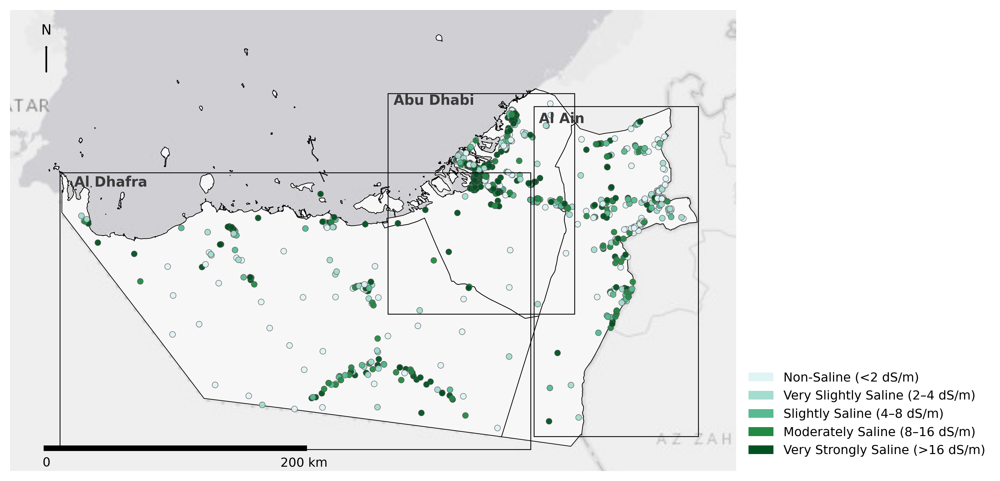

In [14]:
# =================================================
# 2) Read base data
# =================================================
data = pd.read_excel(EXCEL_PATH, sheet_name=SHEET_NAME)
data = data[(data["PHUID"] == 1) & (data["PHSampleUID"] == 1)]
regions = gpd.read_file(ABU_DHABI_SHP).to_crs(3857)

protected = gpd.read_file(PROTECTED_GPKG, layer=PROTECTED_LAYER).to_crs(3857)
protected = protected[(~protected.geometry.isna()) & (~protected.geometry.is_empty)].copy()

# =================================================
# 3) Find region name field
# =================================================
candidate_fields = ["NAMEENGLISH", "NameEnglish", "NAME", "Name", "Region", "REGION", "emirate", "EMIRATE"]
name_field = None
for f in candidate_fields:
    if f in regions.columns:
        name_field = f
        break
if name_field is None:
    raise ValueError(f"Cannot find region name field in regions. Available columns: {list(regions.columns)}")

# =================================================
# 4) Build points GeoDataFrame (dedup by SiteUID) + satph
#    NOTE: this uses ALL SurveyID. If you want one land-use, filter by SurveyID here.
# =================================================
sub = data.copy()
sub = sub.dropna(subset=["Longitude", "Latitude", "SiteUID", "satph"])
sub = sub.sort_values("SiteUID").drop_duplicates(subset=["SiteUID"])

gdf = gpd.GeoDataFrame(
    sub,
    geometry=gpd.points_from_xy(sub["Longitude"], sub["Latitude"]),
    crs="EPSG:4326",
).to_crs(3857)

print("Sites (dedup by SiteUID):", len(gdf))

# =================================================
# 5) pH binning + colors sampled from cmap
# =================================================
labels = [b[2] for b in ph_bins]

# round to 1 decimal to avoid gaps like 6.0 vs 6.1
gdf["satph_round"] = pd.to_numeric(gdf["satec"], errors="coerce").round(1)

def _assign_ph_label(x):
    if pd.isna(x):
        return np.nan
    for lo, hi, lab in ph_bins:
        if (x > lo) and (x <= hi):
            return lab
    return np.nan

gdf["ph_label"] = gdf["satph_round"].apply(_assign_ph_label)

# sample discrete colors from cmap (avoid too-light ends)
cmap = mpl.colormaps.get(CMAP_NAME)
n = len(labels)
sample_pos = np.linspace(0.15, 0.95, n)
ph_colors = [mcolors.to_hex(cmap(p)) for p in sample_pos]
label2color = dict(zip(labels, ph_colors))

# color per point (NaN -> grey)
gdf["ph_color"] = gdf["ph_label"].map(label2color).fillna("#9e9e9e")

# legend handles
ph_legend_handles = [
    Patch(facecolor=label2color[lab], edgecolor="none", label=lab)
    for lab in labels
]

# =================================================
# 6) Split regions (3 main regions)
# =================================================
regions_3 = []
for label, keys in REGION_KEYWORDS:
    mask = np.zeros(len(regions), dtype=bool)
    for k in keys:
        mask |= regions[name_field].astype(str).str.contains(k, case=False, na=False)
    reg = regions[mask].copy()
    if len(reg) == 0:
        print(f"[WARN] Region '{label}' not matched by keywords {keys} in field '{name_field}'")
    regions_3.append((label, reg))

# =================================================
# 7) Compute AOI bboxes by "points inside region"
# =================================================
region_aoi = []  # (label, bbox, pts_in)
for label, reg_poly in regions_3:
    if len(reg_poly) == 0:
        continue

    # points within region polygon(s)
    pts_in = gdf[gdf.within(reg_poly.unary_union)].copy()
    # If boundary points are missing, use intersects instead:
    # pts_in = gdf[gdf.intersects(reg_poly.unary_union)].copy()

    if len(pts_in) == 0:
        print(f"[WARN] No points inside region '{label}'. Skip AOI.")
        continue

    xmin, ymin, xmax, ymax = pts_in.total_bounds
    w = xmax - xmin
    h = ymax - ymin
    pad = max(PAD_MIN_M, PAD_RATIO * max(w, h))

    bbox = (xmin - pad, ymin - pad, xmax + pad, ymax + pad)
    region_aoi.append((label, bbox, pts_in))

    print(f"[INFO] {label}: points={len(pts_in)} pad(km)={pad/1000:.1f} "
          f"bbox(km) w={(bbox[2]-bbox[0])/1000:.1f} h={(bbox[3]-bbox[1])/1000:.1f}")

# =================================================
# 8) FULL MAP (points colored by pH bins + protected areas + AOI rectangles)
# =================================================
fig, ax = plt.subplots(figsize=(12, 6))

xmin, ymin, xmax, ymax = regions.total_bounds
xpad = 0.06 * (xmax - xmin)
ypad = 0.06 * (ymax - ymin)

ax.set_xlim(xmin - xpad, xmax + xpad)
ax.set_ylim(ymin - ypad, ymax + ypad)

cx.add_basemap(ax, source=BASEMAP, zoom=7, attribution=False)

regions.plot(ax=ax, facecolor="#f7f7f7", edgecolor="black", linewidth=0.5, zorder=5)

ax.scatter(
    gdf.geometry.x, gdf.geometry.y,
    s=18, c=gdf["ph_color"],
    edgecolors="#5a5a5a",
    linewidths=0.35,
    alpha=0.95,
    zorder=10
)

# AOI rectangles + labels
for label, bbox, pts_in in region_aoi:
    bxmin, bymin, bxmax, bymax = bbox
    ax.add_patch(Rectangle(
        (bxmin, bymin), bxmax-bxmin, bymax-bymin,
        fill=False, edgecolor="black", linewidth=0.6, zorder=20
    ))
    ax.text(
        bxmin + 0.03*(bxmax-bxmin),
        bymax - 0.05*(bymax-bymin),
        label,
        fontsize=10, weight="bold", color="#3a3a3a", zorder=21
    )

# Legend (pH bins)
ax.legend(
    handles=ph_legend_handles,
    loc="lower left",
    bbox_to_anchor=(1.01, 0.02),  # 👉 图外右侧，靠下
    frameon=False,
    fontsize=9,
    ncol=1,
    borderaxespad=0.0
)

ax.set_axis_off()
add_north_arrow(ax)
add_scale_bar(ax, xmin - xpad, ymin - ypad, xmax + xpad, ymax + ypad, length_km=200)

# fig.savefig(os.path.join(OUT_DIR, "Full_pH_bins.png"), dpi=300, bbox_inches="tight")
plt.show()
fig.savefig(os.path.join(OUT_DIR, "Ch06_ECe_full.png"), bbox_inches="tight", pad_inches=0.1)
fig.savefig(os.path.join(OUT_DIR, "Ch06_ECe_full.svg"), bbox_inches="tight", pad_inches=0.1)

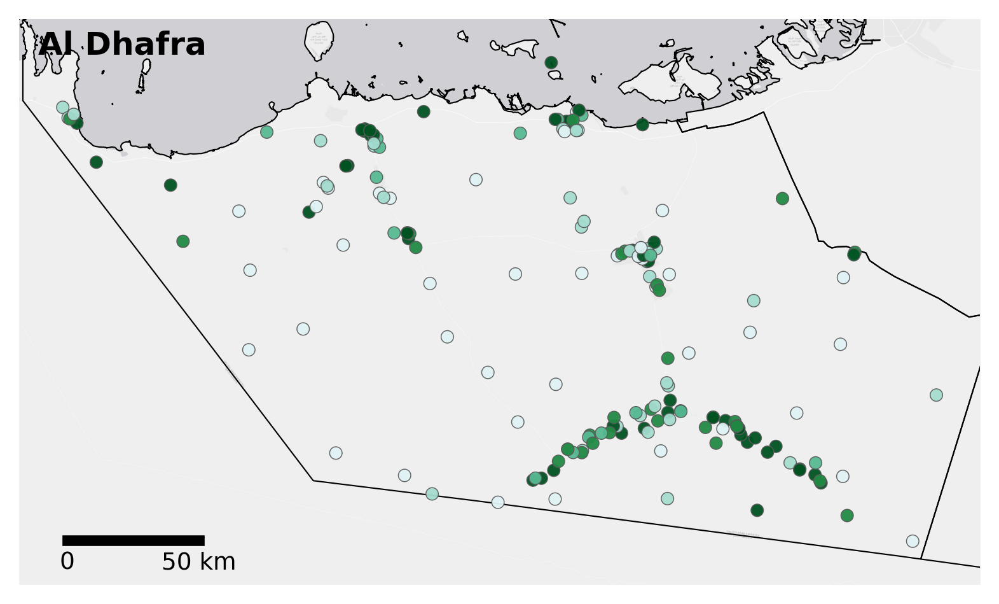

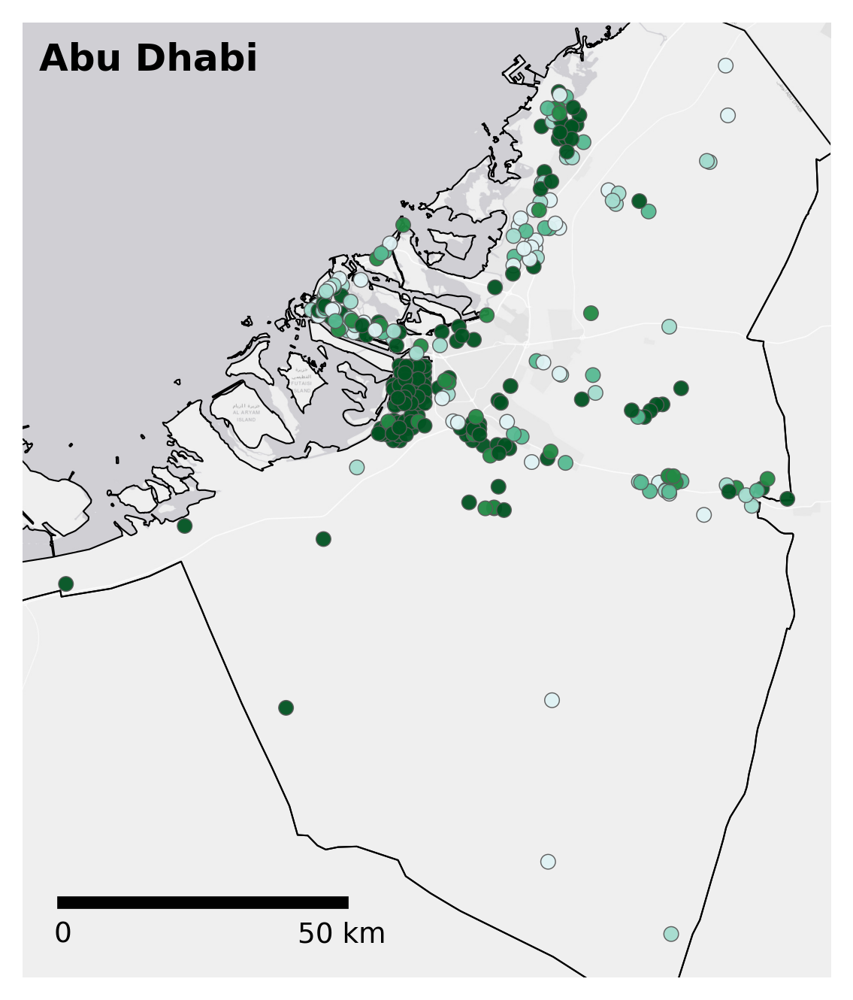

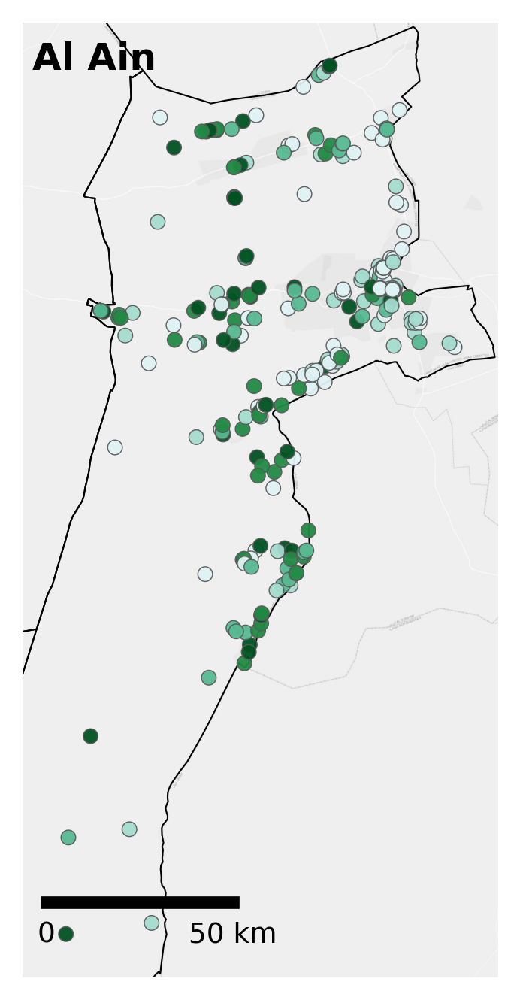

In [15]:
# =================================================
# 9) REGION MAPS (3 separate figures; points colored by pH bins)
# =================================================
for label, bbox, pts_in in region_aoi:
    bxmin, bymin, bxmax, bymax = bbox
    ypad_local = 0.03 * (bymax - bymin)

    fig, ax = plt.subplots(figsize=(6.5, 5.5))
    ax.set_xlim(bxmin, bxmax)
    ax.set_ylim(bymin, bymax)

    cx.add_basemap(ax, source=BASEMAP, zoom=11, attribution=False)

    regions.plot(ax=ax, facecolor="none", edgecolor="black", linewidth=0.5, zorder=5)

    ax.scatter(
        pts_in.geometry.x, pts_in.geometry.y,
        s=22, c=pts_in["ph_color"],
        edgecolors="#5a5a5a",
        linewidths=0.35,
        alpha=0.95,
        zorder=10
    )

    # left-top region label
    ax.text(
        0.02, 0.98, label,
        transform=ax.transAxes,
        ha="left", va="top",
        fontsize=12, weight="bold",
        color="black",
        zorder=50
    )

    ax.set_axis_off()
    add_scale_bar(ax, bxmin, bymin + ypad_local, bxmax, bymax, length_km=50)

    # fig.savefig(os.path.join(OUT_DIR, f"{label.replace(' ', '_')}_pH_bins.png"), dpi=300, bbox_inches="tight")
    plt.show()
    fig.savefig(os.path.join(OUT_DIR, f"Ch06_ECe_{label.replace(' ', '_')}.png"), bbox_inches="tight", pad_inches=0.1)
    fig.savefig(os.path.join(OUT_DIR, f"Ch06_ECe_{label.replace(' ', '_')}.svg"), bbox_inches="tight", pad_inches=0.1)

# **IDW Figures**

In [16]:
import os
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as cx

from matplotlib.patches import FancyArrowPatch
from shapely.ops import unary_union
from scipy.spatial import cKDTree
from shapely import points as shapely_points
import matplotlib as mpl
mpl.rcParams["figure.dpi"] = 300
mpl.rcParams["savefig.dpi"] = 300

# ============================================================
# Map decorations (keep same style)
# ============================================================
def add_north_arrow(ax, x=0.05, y=0.86, dy=0.07):
    arrow = FancyArrowPatch(
        (x, y), (x, y + dy),
        transform=ax.transAxes,
        arrowstyle="-|>",
        linewidth=1.2,
        color="black",
        zorder=30
    )
    ax.add_patch(arrow)
    ax.text(
        x, y + dy + 0.01, "N",
        transform=ax.transAxes,
        ha="center", va="bottom",
        fontsize=10, zorder=30
    )

def add_scale_bar(ax, xmin, ymin, xmax, ymax, length_km=200):
    length_m = length_km * 1000
    x0 = xmin + 0.05 * (xmax - xmin)
    y0 = ymin + 0.05 * (ymax - ymin)

    ax.plot([x0, x0 + length_m], [y0, y0],
            color="black", linewidth=4, zorder=30)

    ax.text(x0, y0 - 0.02 * (ymax - ymin), "0",
            ha="center", va="top", fontsize=9)

    ax.text(x0 + length_m, y0 - 0.02 * (ymax - ymin),
            f"{length_km} km",
            ha="center", va="top", fontsize=9)


# ============================================================
# Basemap safe wrapper (avoids SSL crash)
# ============================================================
def add_basemap_safe(ax, *, source, zoom, attribution=False):
    try:
        cx.add_basemap(ax, source=source, zoom=zoom, attribution=attribution)
        return True
    except Exception as e:
        print(f"[WARN] Basemap failed, continue without basemap. {type(e).__name__}: {e}")
        return False


# ============================================================
# IDW interpolation map function
# ============================================================
def plot_idw_map(
    *,
    excel_path: str,
    sheet_name: str,
    value_col: str,
    abu_dhabi_shp: str,
    out_png: str | None = None,
    # IDW params
    power: float = 2.0,
    k: int = 12,
    eps: float = 1e-12,
    # grid params
    grid_res: int = 1000,
    # display
    cmap: str = "RdYlGn_r",
    vmin: float | None = None,
    vmax: float | None = None,
    alpha: float = 0.85,
    # basemap (use your preferred)
    basemap=cx.providers.Esri.WorldGrayCanvas,
    basemap_zoom: int = 7,
    basemap_attribution: bool = False,
    # polygons styling (this is what makes it look like your reference)
    region_facecolor: str = "#f7f7f7",
    region_edgecolor: str = "black",
    region_linewidth: float = 0.5,
    boundary_linewidth: float = 0.5,
    # optional protected areas overlay
    protected_gpkg: str | None = None,
    protected_layer: str | None = None,
    protected_facecolor: str = "#7FD3C3",
    protected_alpha: float = 0.45,
    # extent padding
    pad_ratio: float = 0.02,
    # decorations
    scale_km: int = 200,
    cbar_label: str | None = None,
    figsize=(12, 8),
):


    # -------------------------
    # 1) boundaries -> one polygon
    # -------------------------
    regions = gpd.read_file(abu_dhabi_shp).to_crs(3857)
    abu_geom = unary_union(regions.geometry)

    protected = None
    if protected_gpkg and protected_layer:
        protected = gpd.read_file(protected_gpkg, layer=protected_layer).to_crs(3857)
        protected = protected[(~protected.geometry.isna()) & (~protected.geometry.is_empty)].copy()

    # -------------------------
    # 2) read points + clean
    # -------------------------
    df = pd.read_excel(excel_path, sheet_name=sheet_name)

    need_cols = ["Longitude", "Latitude", value_col]
    missing = [c for c in need_cols if c not in df.columns]
    if missing:
        raise ValueError(f"Missing columns in Excel: {missing}. Available: {list(df.columns)}")

    df = df.dropna(subset=need_cols).copy()
    df[value_col] = pd.to_numeric(df[value_col], errors="coerce")
    df = df.dropna(subset=[value_col]).copy()

    gdf_pts = gpd.GeoDataFrame(
        df,
        geometry=gpd.points_from_xy(df["Longitude"], df["Latitude"]),
        crs="EPSG:4326"
    ).to_crs(3857)

    # keep points inside Abu Dhabi
    gdf_pts = gdf_pts[gdf_pts.geometry.within(abu_geom)].copy()

    xy = np.column_stack([gdf_pts.geometry.x.values, gdf_pts.geometry.y.values])
    vals = gdf_pts[value_col].values.astype(float)

    print(f"[INFO] {value_col} valid points (within Abu Dhabi): {xy.shape[0]}")
    if xy.shape[0] < 3:
        raise ValueError(f"Not enough valid points for IDW. Got {xy.shape[0]} points.")
    print(f"[INFO] {value_col} min={np.nanmin(vals):.4g} max={np.nanmax(vals):.4g}")

    # -------------------------
    # 3) grid
    # -------------------------
    xmin, ymin, xmax, ymax = regions.total_bounds
    xpad = pad_ratio * (xmax - xmin)
    ypad = pad_ratio * (ymax - ymin)
    xmin2, xmax2 = xmin - xpad, xmax + xpad
    ymin2, ymax2 = ymin - ypad, ymax + ypad

    xs = np.arange(xmin2, xmax2 + grid_res, grid_res)
    ys = np.arange(ymin2, ymax2 + grid_res, grid_res)
    grid_x, grid_y = np.meshgrid(xs, ys)
    grid_points = np.column_stack([grid_x.ravel(), grid_y.ravel()])

    # -------------------------
    # 4) IDW
    # -------------------------
    tree = cKDTree(xy)
    k_use = min(k, xy.shape[0])

    dists, idxs = tree.query(grid_points, k=k_use)
    if k_use == 1:
        dists = dists[:, None]
        idxs = idxs[:, None]

    weights = 1.0 / (np.power(dists, power) + eps)
    z = np.sum(weights * vals[idxs], axis=1) / np.sum(weights, axis=1)
    grid_z = z.reshape(grid_x.shape)

    # -------------------------
    # 5) mask outside Abu Dhabi
    # -------------------------
    mask_points = shapely_points(grid_x.ravel(), grid_y.ravel())
    inside = np.array([abu_geom.contains(p) for p in mask_points], dtype=bool)
    mask = ~inside.reshape(grid_x.shape)
    grid_z_masked = np.ma.array(grid_z, mask=mask)

    # -------------------------
    # 6) plot (THIS is the “background style” you want)
    # -------------------------
    fig, ax = plt.subplots(figsize=figsize)
    ax.set_xlim(xmin2, xmax2)
    ax.set_ylim(ymin2, ymax2)

    # basemap (safe)
    add_basemap_safe(ax, source=basemap, zoom=basemap_zoom, attribution=basemap_attribution)

    # IMPORTANT: cover basemap with light polygon fill (your reference look)
    regions.plot(
        ax=ax,
        facecolor=region_facecolor,
        edgecolor=region_edgecolor,
        linewidth=region_linewidth,
        zorder=4
    )

    # optional protected
    if protected is not None:
        protected.plot(
            ax=ax,
            facecolor=protected_facecolor,
            edgecolor="none",
            alpha=protected_alpha,
            zorder=4.5
        )

    # IDW raster on top
    im = ax.imshow(
        grid_z_masked,
        extent=(xs.min(), xs.max(), ys.min(), ys.max()),
        origin="lower",
        cmap=cmap,
        vmin=vmin,
        vmax=vmax,
        alpha=alpha,
        zorder=5
    )

    # boundary outline on top
    regions.boundary.plot(ax=ax, color="black", linewidth=boundary_linewidth, zorder=10)

    add_north_arrow(ax)
    add_scale_bar(ax, xmin2, ymin2, xmax2, ymax2, length_km=scale_km)

    cbar = fig.colorbar(im, ax=ax, fraction=0.03, pad=0.02)
    if cbar_label is None:
        cbar_label = f"{value_col} Concentration (mg/kg) - IDW"
    cbar.set_label(cbar_label, fontsize=10)

    ax.set_axis_off()

    if out_png:
        os.makedirs(os.path.dirname(out_png), exist_ok=True)
        fig.savefig(out_png, dpi=300, bbox_inches="tight")
        print("[INFO] Saved:", out_png)

    plt.show()
    return fig, ax


[INFO] Arsenic valid points (within Abu Dhabi): 703
[INFO] Arsenic min=0 max=4.113


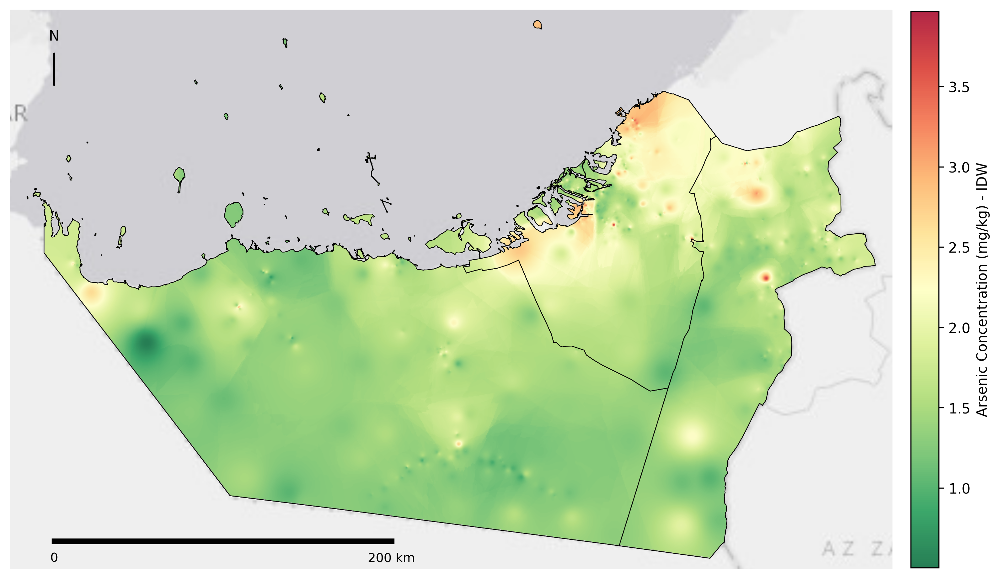

[INFO] Barium valid points (within Abu Dhabi): 705
[INFO] Barium min=5.017 max=125


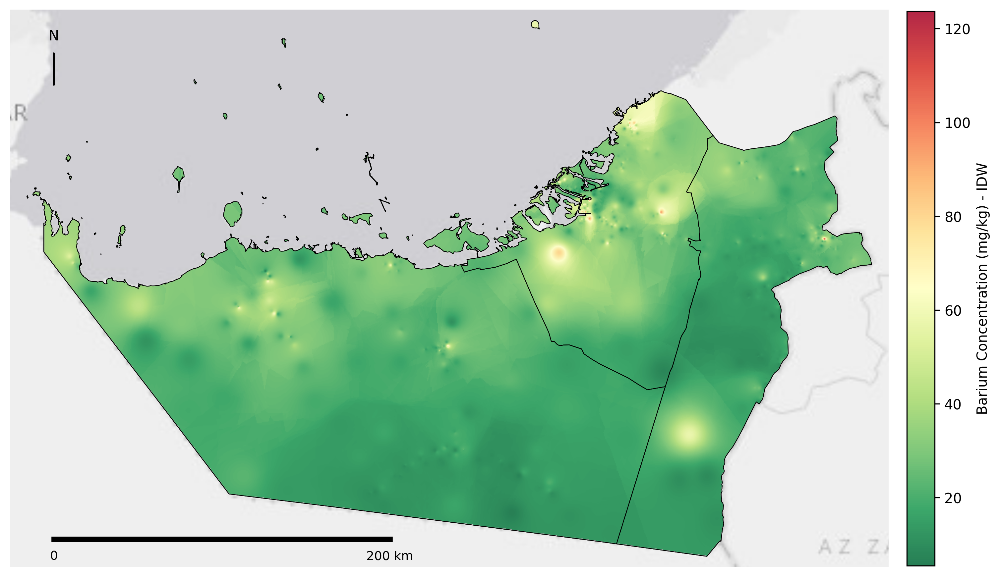

[INFO] Cadmium valid points (within Abu Dhabi): 703
[INFO] Cadmium min=0.025 max=0.39


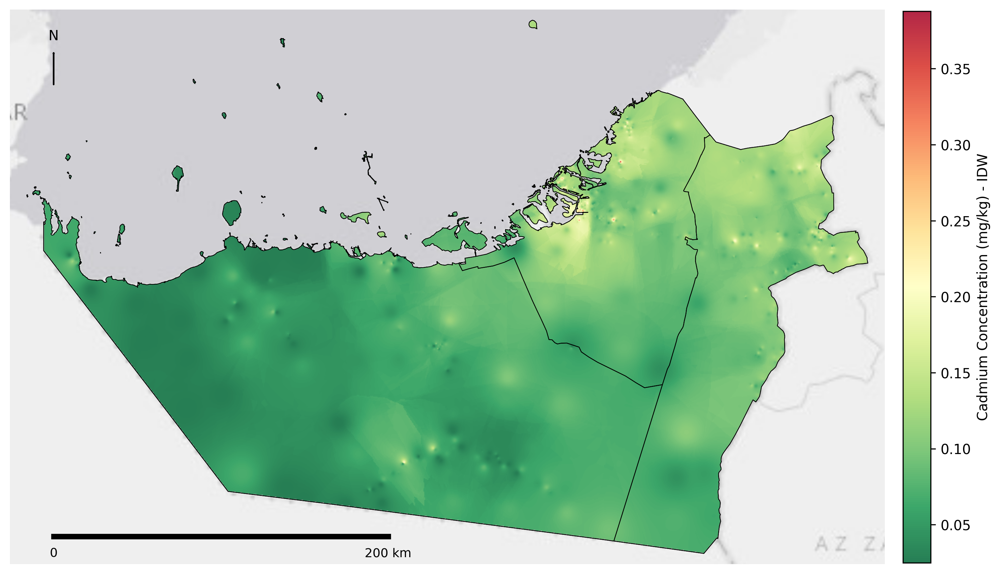

[INFO] Chromium_Total valid points (within Abu Dhabi): 703
[INFO] Chromium_Total min=6.939 max=95.76


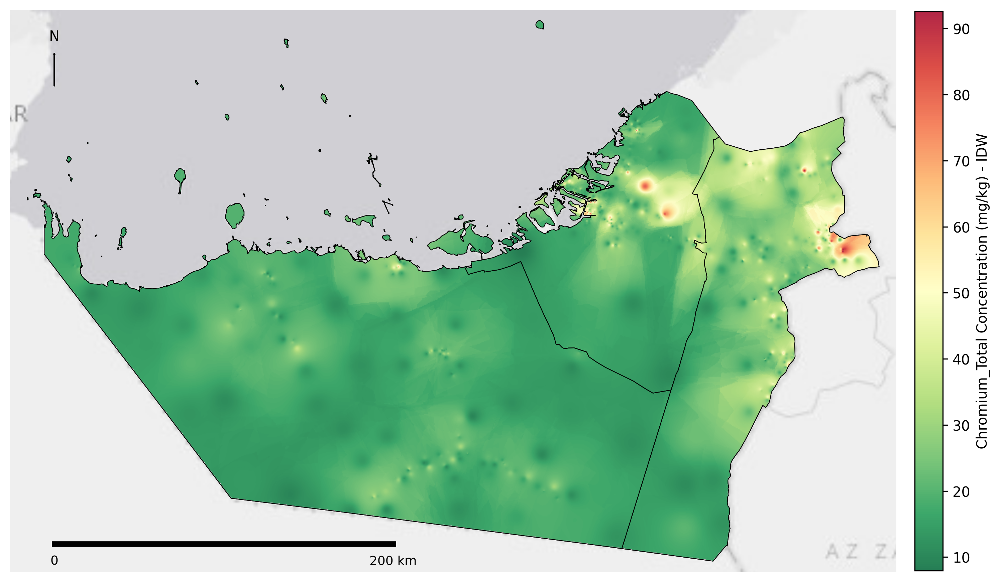

[INFO] Cobalt valid points (within Abu Dhabi): 700
[INFO] Cobalt min=0.876 max=16.59


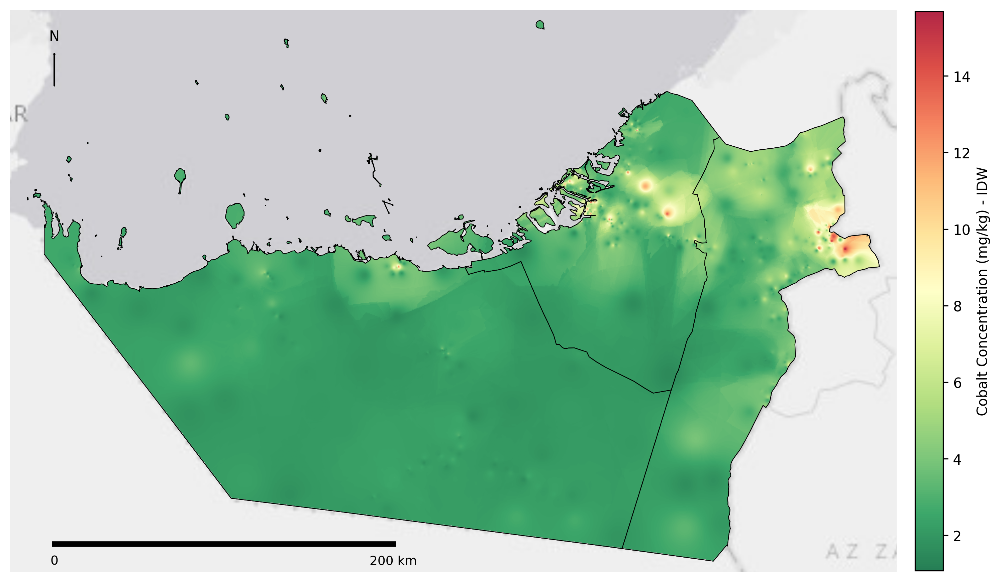

[INFO] Copper valid points (within Abu Dhabi): 705
[INFO] Copper min=2.168 max=48.67


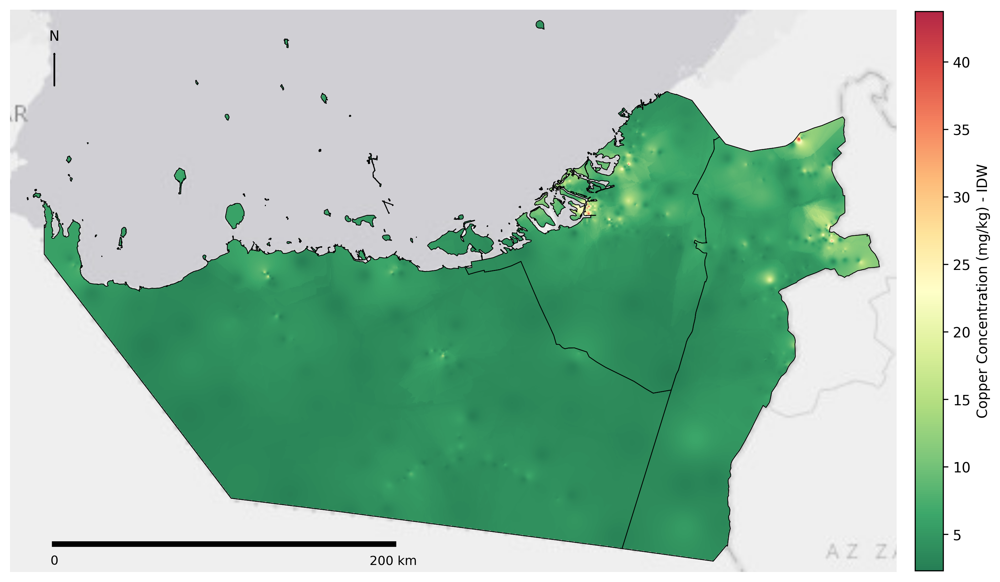

[INFO] Lead_aqua valid points (within Abu Dhabi): 704
[INFO] Lead_aqua min=0.5911 max=25.27


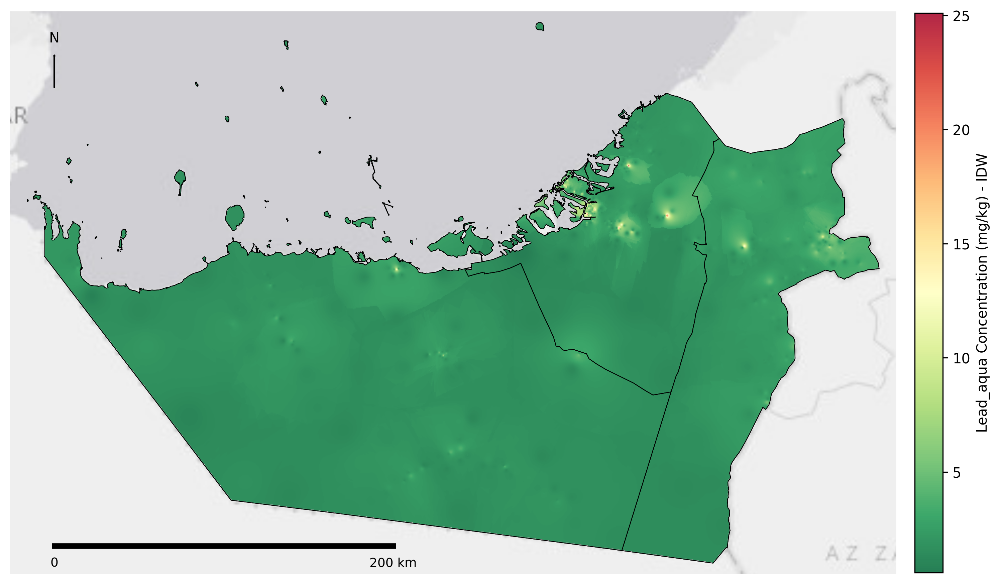

[INFO] Manganese valid points (within Abu Dhabi): 705
[INFO] Manganese min=54.42 max=350.3


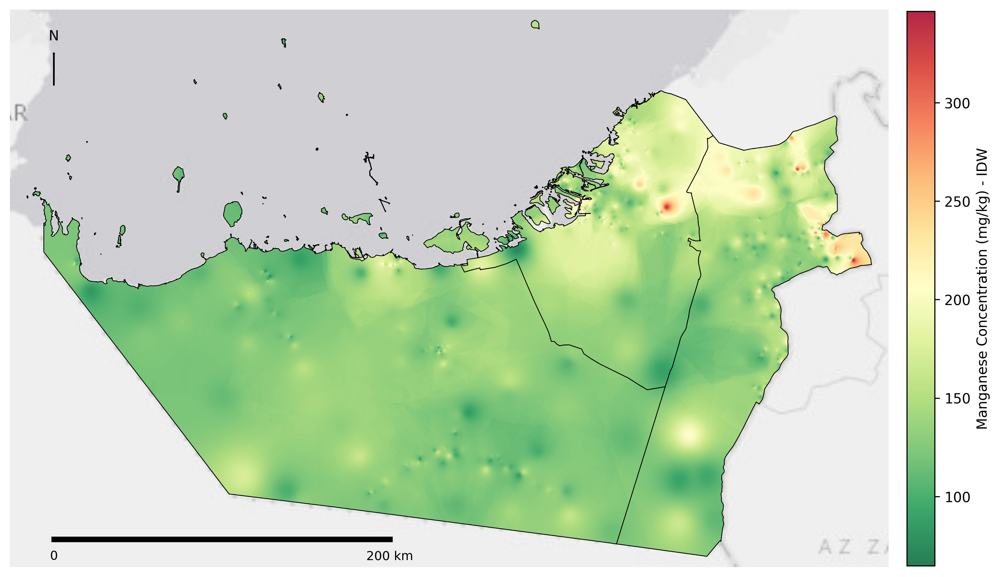

[INFO] Nickel_aqua valid points (within Abu Dhabi): 700
[INFO] Nickel_aqua min=6.944 max=304.6


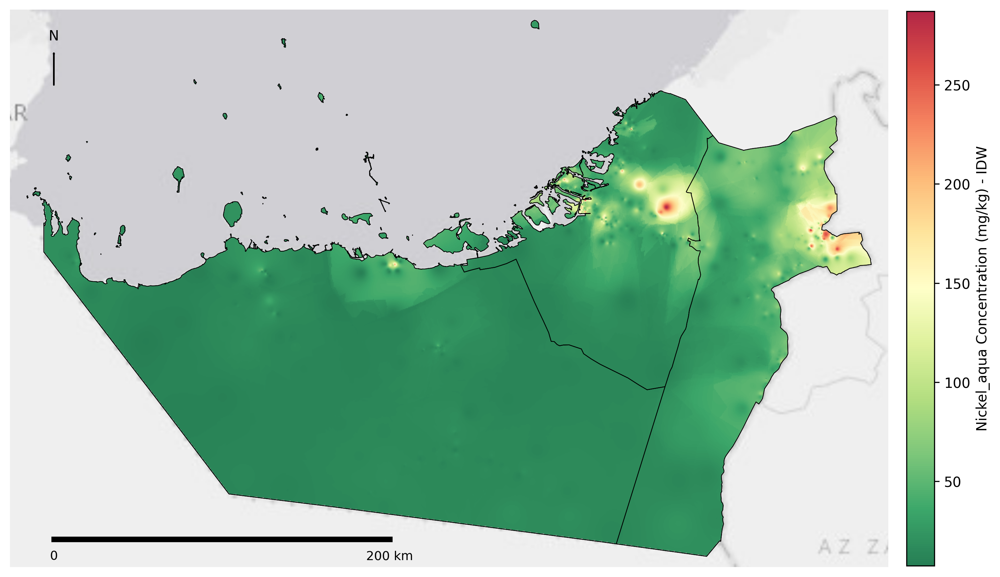

[INFO] Strontium valid points (within Abu Dhabi): 700
[INFO] Strontium min=66.32 max=3942


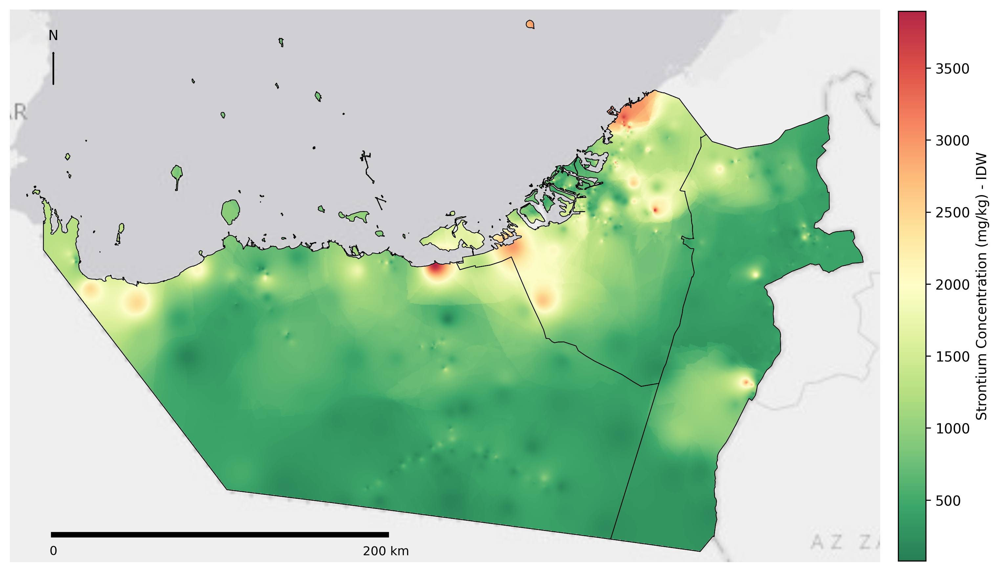

[INFO] Zinc valid points (within Abu Dhabi): 702
[INFO] Zinc min=5.14 max=275.8


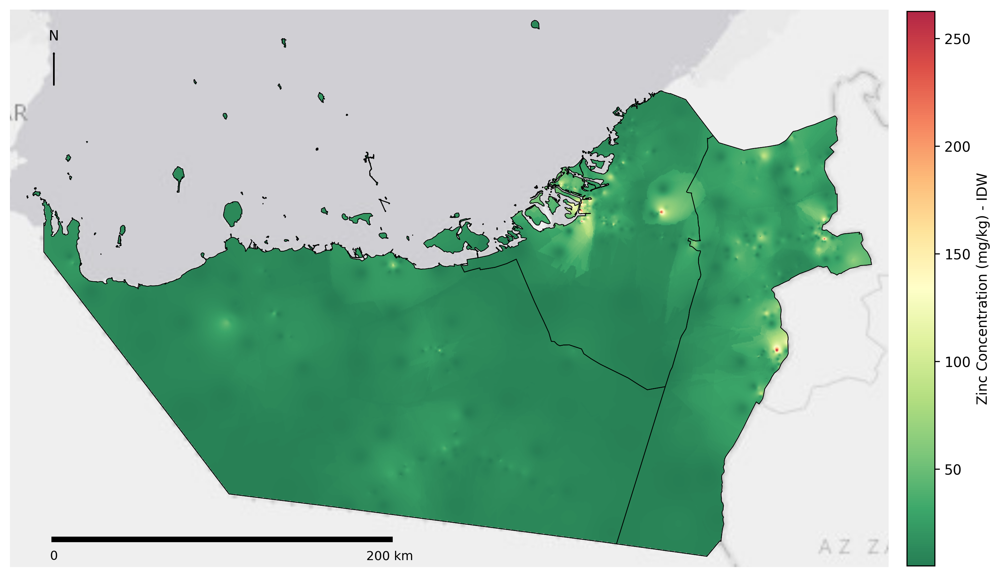

In [17]:
# Arsenic, Barium, Cadmium, Chromium_Total, Cobalt, Copper, Lead_aqua, Manganese, Nickel_aqua, Strontium, Zinc
elements = [
    'Arsenic', 'Barium', 'Cadmium', 'Chromium_Total', 'Cobalt',
    'Copper', 'Lead_aqua', 'Manganese', 'Nickel_aqua', 'Strontium', 'Zinc']
for element in elements:
    fig, ax = plot_idw_map(
        excel_path=r"../Result_hmq/Soil quality data QC/Soil quality data QC 2025.xlsx",
        sheet_name="Processed_Data",
        value_col=element,
        abu_dhabi_shp=r"../data_hmq/Map/abu_dhabi.shp",
        basemap=cx.providers.Esri.WorldGrayCanvas,
        basemap_zoom=7,
        grid_res=500,
        cmap="RdYlGn_r",
    )
    fig.savefig(os.path.join(OUT_DIR, f"Ch06_{element}_IDW.png"), bbox_inches="tight", pad_inches=0.1)
    fig.savefig(os.path.join(OUT_DIR, f"Ch06_{element}_IDW.svg"), bbox_inches="tight", pad_inches=0.1)